<a href="https://www.kaggle.com/code/uom220186u/ds-lab?scriptVersionId=239959600" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/online-shopping/In22-CS3121-Project Dataset.csv
/kaggle/input/datase-excel/In22-CS3121-Project Dataset (1).xlsx


In [2]:
# df = pd.read_csv("/kaggle/input/online-shopping/In22-CS3121-Project Dataset.csv")

In [3]:
df = pd.read_excel("/kaggle/input/datase-excel/In22-CS3121-Project Dataset (1).xlsx")

In [4]:
df

,Timestamp,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,...,Please indicate your level of agreement with the following statements. [Sharing information about my online purchases during a crisis is important for influencing others' purchase decisions.],"Please indicate your level of agreement with the following statements. [Overall, I have a positive attitude toward online shopping during a crisis.]",Please indicate your level of agreement with the following statements. [I believe that online shopping is a practical and efficient way to make purchases during a crisis.],Please indicate your level of agreement with the following statements. [I am concerned about the security of my personal and financial information when shopping online during a crisis.],Please indicate your level of agreement with the following statements. [I am cautious about the reliability and authenticity of products or services offered by online platforms during a crisis.],Have you made online purchases during crisis time?,"Please indicate your level of agreement with the following statements. [Overall, I am satisfied with online purchase during a crisis?]",Please indicate your level of agreement with the following statements. [I Have changed my online shopping behavior during a crisis compared to non-crisis periods?],Please indicate your level of agreement with the following statements. [It was convenient for me to do online shopping during a crisis compared to traditional in-store shopping.],Please indicate your level of agreement with the following statements. [I believe that online shopping during a crisis offers better value for money compared to traditional shopping methods.]
0,2023-08-02 23:59:11.684000,Male,25 - 35,Bachelor's Degree,Single,Yes,Employed (full-time),"daraz.lk, ikman.lk",NaN,NaN,...,Disagree,Neutral,Neutral,Neutral,Neutral,Yes,Neutral,Neutral,Disagree,Neutral
1,2023-08-03 00:04:13.800000,Male,25 - 35,Bachelor's Degree,Single,Yes,Employed (full-time),"daraz.lk, ikman.lk",patpat.lk,"epharma.lk, onlinepharmacy.lk",...,Agree,Neutral,Agree,Neutral,Agree,Yes,Agree,Agree,Agree,Agree
2,2023-08-03 00:15:31.602000,Female,25 - 35,Bachelor's Degree,Single,Yes,Employed (full-time),"daraz.lk, kapruka.com, ikman.lk,","patpat.lk, riyasewana.lk","healthgurd.lk, onlinepharmacy.lk",...,Neutral,Agree,Strongly agree,Agree,Agree,Yes,Agree,Strongly agree,Strongly agree,Agree
3,2023-08-03 00:20:49.096000,Female,25 - 35,Master's Degree or higher,Married,Yes,Employed (full-time),"daraz.lk, ikman.lk",lankavechicle.com,onlinepharmacy.lk,...,Agree,Neutral,Agree,Neutral,Agree,Yes,Agree,Agree,Agree,Agree
4,2023-08-03 00:23:52.006000,Male,25 - 35,Bachelor's Degree,Married,Yes,Employed (full-time),"daraz.lk, wow.lk",riyasewana.lk,"epharma.lk, ceymed.lk",...,Agree,Agree,Agree,Agree,Neutral,Yes,Agree,Agree,Agree,Neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
831,2024-10-07 13:28:36,Male,25 - 35,Master's Degree or higher,Single,Yes,Employed (full-time),"daraz.lk, kapruka.com, ikman.lk, takas.lk","autolanka.com, pricelanka.lk",nearby,...,Neutral,Agree,Agree,Disagree,Agree,Yes,Agree,Agree,Agree,Agree
832,2024-10-07 13:28:38,Male,25 - 35,Master's Degree or higher,Single,Yes,Employed (full-time),"daraz.lk, kapruka.com, ikman.lk, takas.lk","autolanka.com, pricelanka.lk",nearby,...,Neutral,Agree,Disagree,Strongly Agree,Agree,Yes,Agree,Agree,Agree,Agree
833,2024-10-07 13:28:39,Male,25 - 35,Master's Degree or higher,Single,Yes,Employed (full-time),"daraz.lk, kapruka.com, ikman.lk, takas.lk","autolanka.com, pricelanka.lk",nearby,...,Neutral,Agree,Disagree,Strongly Agree,Agree,Yes,Agree,Neutral,Agree,Neutral
834,2024-10-07 13:28:40,Male,25 - 35,Master's Degree or higher,Single,Yes,Employed (full-time),"daraz.lk, kapruka.com, ikman.lk, takas.lk","autolanka.com, pricelanka.lk",ne

In [5]:
df.shape

(836, 59)

In [6]:
pd.set_option('display.max_column', None)


# **Data Preprocesing**

In [7]:
# df = df.drop("Timestamp", axis=1)

In [8]:
df.duplicated().sum()

11

In [9]:
df.loc[df.duplicated()]

,Timestamp,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,Fashion and beauty retailers,Grocery delivery services,Please indicate your level of agreement with the following statements. [It is easy to navigate through the online platform to find the products or services I need.],Please indicate your level of agreement with the following statements. [The online platform provides clear and intuitive navigation options.],Please indicate your level of agreement with the following statements. [It was easy for me to learn how to use the online platform for making online purchases.],Please indicate your level of agreement with the following statements. [I quickly became proficient in using the online platform for making online purchases during a crisis.],Please indicate your level of agreement with the following statements. [The instructions provided on the online platform are clear and easy to understand.],Please indicate your level of agreement with the following statements. [I can easily follow the instructions given on the online platform for making online purchases.],"Please indicate your level of agreement with the following statements. [The online platform responds quickly to my actions, such as loading pages and processing transactions.]",Please indicate your level of agreement with the following statements. [I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.],"Please indicate your level of agreement with the following statements. [The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.]",Please indicate your level of agreement with the following statements. [I rarely encounter errors or issues when using the online platform for making online purchases during a crisis.],Please indicate your level of agreement with the following statements. [The online platform offers a wide range of products and services that meet my needs during a crisis.],Please indicate your level of agreement with the following statements. [I can find the products or services I need on the online platform during a crisis.],Please indicate your level of agreement with the following statements. [Using the online platform for making purchases during a crisis is convenient and saves time.],Please indicate your level of agreement with the following statements. [The online platform makes it easy to search for products and complete transactions during a crisis.],"Please indicate your level of agreement with the following statements. [The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.]",Please indicate your level of agreement with the following statements. [I perceive that using the online platform for making purchases during a crisis can help me save money.],Please indicate your level of agreement with the following statements. [The online platform provides detailed and accurate product information during a crisis.],"Please indicate your level of agreement with the following statements. [I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.]","Please indicate your level of agreement with the following statements. [The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.]",Please indicate your level of agreement with the following statements. [I feel that the online platform understands my needs and preferences during a crisis.],Please indicate your level of agreement with the following statements. [The online platform takes appropriate measures to protect my privacy.],Please indicate your level of agreement with the following statements. [I trust that my personal information will be handled securely by the online platform

In [10]:
df = df.drop_duplicates()

In [11]:
df.shape

(825, 59)

In [12]:
df.dtypes

Timestamp                                                                                                                                                                                                 object
Gender                                                                                                                                                                                                    object
Age                                                                                                                                                                                                       object
Highest level of education                                                                                                                                                                                object
Marital Status                                                                                                                                                      

In [13]:
df.isnull().sum()

Timestamp                                                                                                                                                                                                   0
Gender                                                                                                                                                                                                      0
Age                                                                                                                                                                                                         0
Highest level of education                                                                                                                                                                                  0
Marital Status                                                                                                                                                                  

In [14]:
df.columns = df.columns.str.strip()

In [15]:
df['Gender'].unique()

array(['Male', 'Female', 'Prefer not to say'], dtype=object)

In [16]:
df['Age'].unique()

array(['25 - 35', '18 - 25', '35 - 45', '45 - 55'], dtype=object)

In [17]:
df['Highest level of education'].unique()

array(["Bachelor's Degree", "Master's Degree or higher",
       'Diploma / Certificate Course', 'Grade 8 pass', 'High school',
       'Postgraduate Diploma', 'School '], dtype=object)

In [18]:
df['Marital Status'].unique()

array(['Single', 'Married'], dtype=object)

In [19]:
df['Have used online shopping platforms before'].unique()

array(['Yes', 'No'], dtype=object)

In [20]:
df['Have used online shopping platforms before'].value_counts()

Have used online shopping platforms before
Yes    822
No       3
Name: count, dtype: int64

In [21]:
df[df['Have used online shopping platforms before']=="No"]

,Timestamp,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,Fashion and beauty retailers,Grocery delivery services,Please indicate your level of agreement with the following statements. [It is easy to navigate through the online platform to find the products or services I need.],Please indicate your level of agreement with the following statements. [The online platform provides clear and intuitive navigation options.],Please indicate your level of agreement with the following statements. [It was easy for me to learn how to use the online platform for making online purchases.],Please indicate your level of agreement with the following statements. [I quickly became proficient in using the online platform for making online purchases during a crisis.],Please indicate your level of agreement with the following statements. [The instructions provided on the online platform are clear and easy to understand.],Please indicate your level of agreement with the following statements. [I can easily follow the instructions given on the online platform for making online purchases.],"Please indicate your level of agreement with the following statements. [The online platform responds quickly to my actions, such as loading pages and processing transactions.]",Please indicate your level of agreement with the following statements. [I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.],"Please indicate your level of agreement with the following statements. [The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.]",Please indicate your level of agreement with the following statements. [I rarely encounter errors or issues when using the online platform for making online purchases during a crisis.],Please indicate your level of agreement with the following statements. [The online platform offers a wide range of products and services that meet my needs during a crisis.],Please indicate your level of agreement with the following statements. [I can find the products or services I need on the online platform during a crisis.],Please indicate your level of agreement with the following statements. [Using the online platform for making purchases during a crisis is convenient and saves time.],Please indicate your level of agreement with the following statements. [The online platform makes it easy to search for products and complete transactions during a crisis.],"Please indicate your level of agreement with the following statements. [The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.]",Please indicate your level of agreement with the following statements. [I perceive that using the online platform for making purchases during a crisis can help me save money.],Please indicate your level of agreement with the following statements. [The online platform provides detailed and accurate product information during a crisis.],"Please indicate your level of agreement with the following statements. [I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.]","Please indicate your level of agreement with the following statements. [The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.]",Please indicate your level of agreement with the following statements. [I feel that the online platform understands my needs and preferences during a crisis.],Please indicate your level of agreement with the following statements. [The online platform takes appropriate measures to protect my privacy.],Please indicate your level of agreement with the following statements. [I trust that my personal information will be handled securely by the online platform

In [22]:
df['Professional Background'].unique()

array(['Employed (full-time)', 'Employed (part-time)', 'Student',
       'Jobless', 'Self-employed / Entrepreneur', 'Unemployed'],
      dtype=object)

In [23]:
df.loc[df['Professional Background'] == "Jobless", 'Professional Background'] = "Unemployed"

/tmp/ipykernel_13/488777259.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[df['Professional Background'] == "Jobless", 'Professional Background'] = "Unemployed"


In [24]:
df['General E-Commerce Platforms'].value_counts()

General E-Commerce Platforms
daraz.lk, kapruka.com, ikman.lk                                                                  292
daraz.lk                                                                                         109
daraz.lk, kapruka.com                                                                             92
daraz.lk, ikman.lk                                                                                71
daraz.lk, kapruka.com, ikman.lk, wow.lk                                                           60
daraz.lk, kapruka.com, ikman.lk, takas.lk                                                         40
kapruka.com                                                                                       33
daraz.lk, kapruka.com, ikman.lk, takas.lk, wow.lk                                                 11
daraz.lk, wow.lk                                                                                   8
daraz.lk, ikman.lk, wow.lk                                    

In [25]:
df['General E-Commerce Platforms'].isnull().sum()

15

In [26]:
df[df['General E-Commerce Platforms'].isnull()]

,Timestamp,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,Fashion and beauty retailers,Grocery delivery services,Please indicate your level of agreement with the following statements. [It is easy to navigate through the online platform to find the products or services I need.],Please indicate your level of agreement with the following statements. [The online platform provides clear and intuitive navigation options.],Please indicate your level of agreement with the following statements. [It was easy for me to learn how to use the online platform for making online purchases.],Please indicate your level of agreement with the following statements. [I quickly became proficient in using the online platform for making online purchases during a crisis.],Please indicate your level of agreement with the following statements. [The instructions provided on the online platform are clear and easy to understand.],Please indicate your level of agreement with the following statements. [I can easily follow the instructions given on the online platform for making online purchases.],"Please indicate your level of agreement with the following statements. [The online platform responds quickly to my actions, such as loading pages and processing transactions.]",Please indicate your level of agreement with the following statements. [I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.],"Please indicate your level of agreement with the following statements. [The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.]",Please indicate your level of agreement with the following statements. [I rarely encounter errors or issues when using the online platform for making online purchases during a crisis.],Please indicate your level of agreement with the following statements. [The online platform offers a wide range of products and services that meet my needs during a crisis.],Please indicate your level of agreement with the following statements. [I can find the products or services I need on the online platform during a crisis.],Please indicate your level of agreement with the following statements. [Using the online platform for making purchases during a crisis is convenient and saves time.],Please indicate your level of agreement with the following statements. [The online platform makes it easy to search for products and complete transactions during a crisis.],"Please indicate your level of agreement with the following statements. [The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.]",Please indicate your level of agreement with the following statements. [I perceive that using the online platform for making purchases during a crisis can help me save money.],Please indicate your level of agreement with the following statements. [The online platform provides detailed and accurate product information during a crisis.],"Please indicate your level of agreement with the following statements. [I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.]","Please indicate your level of agreement with the following statements. [The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.]",Please indicate your level of agreement with the following statements. [I feel that the online platform understands my needs and preferences during a crisis.],Please indicate your level of agreement with the following statements. [The online platform takes appropriate measures to protect my privacy.],Please indicate your level of agreement with the following statements. [I trust that my personal information will be handled securely by the online platform

In [27]:
df['General E-Commerce Platforms'] = df['General E-Commerce Platforms'].fillna("Haven't used")

/tmp/ipykernel_13/458082413.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['General E-Commerce Platforms'] = df['General E-Commerce Platforms'].fillna("Haven't used")


In [28]:
df['General E-Commerce Platforms'].unique()

array(['daraz.lk, ikman.lk', 'daraz.lk, kapruka.com, ikman.lk, ',
       'daraz.lk, wow.lk', 'daraz.lk, kapruka.com, ikman.lk',
       'daraz.lk, kapruka.com',
       'kapruka.com, ikman.lk, takas.lk, Wishque',
       'daraz.lk, kapruka.com, ',
       'daraz.lk, kapruka.com, ikman.lk, takas.lk, wow.lk',
       'kapruka.com, Ali Express.com', 'daraz.lk', "Haven't used",
       'daraz.lk, kapruka.com, ikman.lk, Wishique ',
       'daraz.lk, kapruka.com, Online clothing stores ',
       'daraz.lk, ikman.lk, wow.lk', 'ikman.lk', 'kapruka.com',
       'daraz.lk, ', 'daraz.lk, Ali express', 'daraz.lk, Strong.lk',
       'Ali express, ebay', 'kapruka.com, ikman.lk', 'daraz.lk, Keels',
       'daraz.lk, ikman.lk, takas.lk, wow.lk',
       'daraz.lk, Keels website, Vishq',
       'daraz.lk, kapruka.com, ikman.lk, Amazon ,ebay',
       'daraz.lk, kapruka.com, ikman.lk, Used some platforms to purchase books and electronic items. ',
       'kapruka.com, ikman.lk, takas.lk, wow.lk',
       'kapruka

In [29]:
df['General E-Commerce Platforms'].isnull().sum()

0

In [30]:
df['Specialty Online Stores / automobile'].value_counts()

Specialty Online Stores / automobile
riyasewana.lk                                                                155
autolanka.com, riyasewana.lk                                                 106
pricelanka.lk, patpat.lk                                                      64
autolanka.com, patpat.lk                                                      63
autolanka.com, pricelanka.lk                                                  32
patpat.lk, riyasewana.lk                                                      29
ikman.lk                                                                      29
patpat.lk                                                                     26
riyasewana.lk, lankavechicle.com                                              24
autolanka.com, riyasewana.lk, ikman.lk                                        17
autolanka.com                                                                 12
amazon                                                                  

In [31]:
df['Specialty Online Stores / automobile'].isnull().sum()

222

In [32]:
df['Specialty Online Stores / automobile'] = df['Specialty Online Stores / automobile'].fillna("Haven't used")
null_responses = ['No','None ','N/a','No experience in this flatform']
for each in df['Specialty Online Stores / automobile']:
    if each in null_responses:
        df['Specialty Online Stores / automobile'] =df['Specialty Online Stores / automobile'].replace(each, "Haven't used")

/tmp/ipykernel_13/2600936861.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Specialty Online Stores / automobile'] = df['Specialty Online Stores / automobile'].fillna("Haven't used")
/tmp/ipykernel_13/2600936861.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Specialty Online Stores / automobile'] =df['Specialty Online Stores / automobile'].replace(each, "Haven't used")


In [33]:
df['Specialty Online Stores / automobile'].unique()

array(["Haven't used", 'patpat.lk', 'patpat.lk, riyasewana.lk',
       'lankavechicle.com', 'riyasewana.lk', 'autolanka.com',
       'autolanka.com, riyasewana.lk',
       'patpat.lk, riyasewana.lk, lankavechicle.com', 'pricelanka.lk',
       'riyasewana.lk, ', 'riyasewana.lk, lankavechicle.com',
       'autolanka.com, pricelanka.lk, patpat.lk, riyasewana.lk, lankavechicle.com',
       'autolanka.com, Toyota', 'autolanka.com, patpat.lk', 'Ikman.lk',
       'autolanka.com, patpat.lk, riyasewana.lk',
       'pricelanka.lk, patpat.lk', 'amazon', 'ikman.lk',
       'autolanka.com, riyasewana.lk, ikman.lk',
       'autolanka.com, pricelanka.lk'], dtype=object)

In [34]:
df['Specialty Online Stores / automobile'].isnull().sum()

0

In [35]:
df['Online pharmacies'].value_counts()

Online pharmacies
onlinepharmacy.lk                                                        167
nearby                                                                    93
healthgurd.lk, healthnet.lk, onlinepharmacy.lk                            60
healthgurd.lk                                                             54
epharma.lk                                                                48
healthgurd.lk, ceymed.lk, nearby                                          43
healthnet.lk                                                              28
ceymed.lk                                                                 13
healthgurd.lk, ceymed.lk                                                   8
No                                                                         4
epharma.lk, healthgurd.lk, healthnet.lk, onlinepharmacy.lk, ceymed.lk      3
epharma.lk, onlinepharmacy.lk                                              2
onlinepharmacy.lk, ceymed.lk                              

In [36]:
df['Online pharmacies'].isnull().sum()

276

In [37]:
df['Online pharmacies'] = df['Online pharmacies'].fillna("Haven't used")
null_responses = ['No ','No','None ','N/a',"Didn't order any pharmacy items online","nearby", "Pharmacy", "Nearby"]
for each in df['Online pharmacies']:
    if each in null_responses:
        df['Online pharmacies'] = df['Online pharmacies'].replace(each, "Haven't used")

/tmp/ipykernel_13/4020049032.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Online pharmacies'] = df['Online pharmacies'].fillna("Haven't used")
/tmp/ipykernel_13/4020049032.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Online pharmacies'] = df['Online pharmacies'].replace(each, "Haven't used")


In [38]:
df['Online pharmacies'].unique()

array(["Haven't used", 'epharma.lk, onlinepharmacy.lk',
       'healthgurd.lk, onlinepharmacy.lk', 'onlinepharmacy.lk',
       'epharma.lk, ceymed.lk', 'healthgurd.lk, ceymed.lk',
       'healthgurd.lk', 'Union chemist ', 'epharma.lk', 'ceymed.lk',
       'epharma.lk, healthgurd.lk, ceymed.lk', 'healthnet.lk',
       'epharma.lk, healthgurd.lk, onlinepharmacy.lk',
       'epharma.lk, healthgurd.lk, healthnet.lk, onlinepharmacy.lk, ceymed.lk',
       'Pharmacy ', 'onlinepharmacy.lk, ceymed.lk',
       'epharma.lk, healthgurd.lk, healthnet.lk, ceymed.lk',
       'healthgurd.lk, healthnet.lk',
       'healthgurd.lk, healthnet.lk, onlinepharmacy.lk',
       'healthgurd.lk, ceymed.lk, nearby'], dtype=object)

In [39]:
df['Online pharmacies'].isnull().sum()

0

In [40]:
df['Fashion and beauty retailers'].value_counts()

Fashion and beauty retailers
kapruka.com/fashion                                                                  157
kapruka.com/fashion, thilakawardana.lk                                                93
kapruka.com/fashion, fashionbug.lk, odel.lk, kelly felder, mimosa                     58
kapruka.com/fashion, gflock, Kellf Felder                                             43
kapruka.com/fashion, Gflock, Spring and Summer                                        39
thilakawardana.lk                                                                     36
odel.lk                                                                               35
odel.lk, midnightdivas.com                                                            16
fashionbug.lk                                                                         14
kapruka.com/fashion, odel.lk                                                          12
kapruka.com/fashion, Kelly Felder                                                

In [41]:
df['Fashion and beauty retailers'].isnull().sum()

208

In [42]:
df['Fashion and beauty retailers'] = df['Fashion and beauty retailers'].fillna("Haven't used")
null_responses = ['Didn’t used','N/a']
for each in df['Fashion and beauty retailers']:
    if each in null_responses:
        df['Fashion and beauty retailers'] = df['Fashion and beauty retailers'].replace(each, "Haven't used")

/tmp/ipykernel_13/2354092409.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Fashion and beauty retailers'] = df['Fashion and beauty retailers'].fillna("Haven't used")
/tmp/ipykernel_13/2354092409.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Fashion and beauty retailers'] = df['Fashion and beauty retailers'].replace(each, "Haven't used")


In [43]:
df['Fashion and beauty retailers'].unique()

array(["Haven't used", 'kapruka.com/fashion, fashionbug.lk, odel.lk',
       'thilakawardana.lk, fashionbug.lk, odel.lk, Noorareed.lk',
       'fashionbug.lk', 'fashionbug.lk, midnightdivas.com',
       'kapruka.com/fashion, thilakawardana.lk, fashionbug.lk, odel.lk',
       'kapruka.com/fashion, odel.lk', 'odel.lk', 'Kelly felder',
       'odel.lk, Zigzag.lk', 'thilakawardana.lk, fashionbug.lk',
       'kapruka.com/fashion', 'fashionbug.lk, odel.lk',
       'odel.lk, midnightdivas.com',
       'fashionbug.lk, odel.lk, midnightdivas.com', 'midnightdivas.com',
       'kapruka.com/fashion, odel.lk, midnightdivas.com',
       'kapruka.com/fashion, fashionbug.lk', 'thilakawardana.lk',
       'thilakawardana.lk, fashionbug.lk, odel.lk',
       'kapruka.com/fashion, thilakawardana.lk, odel.lk', 'Moose',
       'Chenara dodge', 'dsi',
       'kapruka.com/fashion, thilakawardana.lk, fashionbug.lk, odel.lk, midnightdivas.com',
       'thilakawardana.lk, odel.lk', 'Nills, chenara dodge',
       

In [44]:
df['Fashion and beauty retailers'].isnull().sum()

0

In [45]:
df['Grocery delivery services'].value_counts()

Grocery delivery services
ubereats.com, pickmefoods.com, keellssuper.lk                                  352
ubereats.com, pickmefoods.com, keellssuper.lk, arpico.lk                        94
ubereats.com, pickmefoods.com                                                   92
ubereats.com                                                                    66
ubereats.com, keellssuper.lk                                                    37
arpico.lk                                                                       33
keellssuper.lk                                                                  29
pickmefoods.com, keellssuper.lk                                                 15
pickmefoods.com                                                                 12
ubereats.com, pickmefoods.com, keellssuper.lk, arpico.lk, cinnamonhotel.com      7
keellssuper.lk, arpico.lk                                                        4
ubereats.com, pickmefoods.com, arpico.lk                     

In [46]:
df['Grocery delivery services'].isnull().sum()

54

In [47]:
df['Grocery delivery services'] = (
    df['Grocery delivery services']
    .replace({'N/a': "Haven't used"})
    .fillna("Haven't used")
)


/tmp/ipykernel_13/1832526974.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Grocery delivery services'] = (


In [48]:
df['Grocery delivery services'].unique()

array(['ubereats.com', 'ubereats.com, pickmefoods.com, keellssuper.lk',
       'ubereats.com, pickmefoods.com',
       'ubereats.com, pickmefoods.com, keellssuper.lk, arpico.lk',
       'ubereats.com, pickmefoods.com, arpico.lk',
       'keellssuper.lk, arpico.lk', 'ubereats.com, keellssuper.lk',
       "Haven't used", 'keellssuper.lk', 'pickmefoods.com',
       'pickmefoods.com, keellssuper.lk',
       'ubereats.com, pickmefoods.com, keellssuper.lk, arpico.lk, Glomark',
       'ubereats.com, pickmefoods.com, keellssuper.lk, arpico.lk, cinnamonhotel.com',
       'keellssuper.lk, arpico.lk, cinnamonhotel.com',
       'ubereats.com, pickmefoods.com, cinnamonhotel.com',
       'ubereats.com, pickmefoods.com, keellssuper.lk, glomark.lk',
       'ubereats.com, pickmefoods.com, keellssuper.lk, cinnamonhotel.com',
       'ubereats.com, Cargillis food city',
       'keellssuper.lk, Cargillsonline.com',
       'ubereats.com, keellssuper.lk, arpico.lk',
       'ubereats.com, arpico.lk', 'keellss

In [49]:
df['Grocery delivery services'].isnull().sum()

0

In [50]:
# for col in df.columns:
#     print(f"Value counts for: {col}")
#     print(df[col].value_counts(dropna=False))
#     print("-" * 50)

In [51]:
# Define typo corrections and standardization
response_cleanup = {
    'Strongly Agree': 'Strongly agree',
    'Strongly Disagree': 'Strongly disagree',
    'Srongly Agree': 'Strongly agree',
    'Srongly Disagree': 'Strongly disagree',
    'neutral': 'Neutral'
}

# Define label encoding mapping
encoding_map = {
    'Strongly disagree': 1,
    'Disagree': 2,
    'Neutral': 3,
    'Agree': 4,
    'Strongly agree': 5
}

# If you also need to encode Yes/No questions
yes_no_map = {
    'No': 0,
    'Yes': 1
}

# Identify your agreement columns and yes/no columns
agreement_columns = [col for col in df.columns if 'indicate your level of agreement' in col]
yes_no_columns = ['Have you made online purchases during crisis time?','Have used online shopping platforms before']  

# Process agreement columns
for col in agreement_columns:
    df[col] = df[col].replace(response_cleanup)   # Clean up typos
    df[col] = df[col].map(encoding_map)           # Encode values

# Process Yes/No columns
for col in yes_no_columns:
    df[col] = df[col].map(yes_no_map)


/tmp/ipykernel_13/2832938127.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].replace(response_cleanup)   # Clean up typos
/tmp/ipykernel_13/2832938127.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].map(encoding_map)           # Encode values
/tmp/ipykernel_13/2832938127.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

In [52]:
# for col in agreement_columns:
#     print(df[col].value_counts(dropna=False))
#     print("-" * 50)


# for col in yes_no_columns:
#     print(df[col].value_counts(dropna=False))
#     print("-" * 50)


In [53]:
# df.nunique()

In [54]:
import re

# Get current column names
columns = df.columns.tolist()

# Clean columns from the 13th one onwards (index 12)
for i in range(11, len(columns)):
    # Use regex to extract text inside square brackets
    match = re.search(r"\[(.*?)\]", columns[i])
    if match:
        columns[i] = match.group(1).strip()

# Set the cleaned column names back
df.columns = columns

# Optional: Print and check
print(df.columns.tolist())

['Timestamp', 'Gender', 'Age', 'Highest level of education', 'Marital Status', 'Have used online shopping platforms before', 'Professional Background', 'General E-Commerce Platforms', 'Specialty Online Stores / automobile', 'Online pharmacies', 'Fashion and beauty retailers', 'Grocery delivery services', 'It is easy to navigate through the online platform to find the products or services I need.', 'The online platform provides clear and intuitive navigation options.', 'It was easy for me to learn how to use the online platform for making online purchases.', 'I quickly became proficient in using the online platform for making online purchases during a crisis.', 'The instructions provided on the online platform are clear and easy to understand.', 'I can easily follow the instructions given on the online platform for making online purchases.', 'The online platform responds quickly to my actions, such as loading pages and processing transactions.', "I don't experience delays or long waitin

In [55]:
# for col in df.columns[7:12]:
#     print(df[col].value_counts(dropna=False))
#     print("-" * 50)

In [56]:
import re

# Function to clean and standardize individual platform names
def clean_platform_name(platform):
    platform = platform.strip().rstrip(',').lower()
    
    # Ignore irrelevant phrases
    ignore_list = [
        'online clothing stores',
        'used some platforms to purchase books',
        'electronic items.',
        'clothing stores',
        'online shopping websites of supermarkets',
        'nearby',
        'fashion',
        'https:',
        'spring',
        'summer'
    ]
    if platform in ignore_list:
        return ''

    # Normalize URLs
    platform = re.sub(r'(https?:\/\/)?(www\.)?', '', platform)
    platform = re.sub(r'\.(com|lk|net|org)$', '', platform)
    
    # Standardization replacements
    replacements = {
        r'ali\s*express': 'aliexpress',
        r'keels\s*website|keels': 'keellssuper',
        r'vishq|wishique': 'wishque',
        r'\bpickme\b': 'pickmefoods',
        r'kellf\s*felder|kellyfelder': 'kelly felder',
        r's\s*&\s*s|spring\s*(and)?\s*summer': 'spring and summer',
        r'insta\s*shop[s]?|instagram\s*store[s]?': 'instagram stores',
        r'cargillis\s*food\s*city': 'cargillsonline',
        r'tharshana|tharshana\s*stores': 'tharshana',
    }
    
    for pattern, replacement in replacements.items():
        platform = re.sub(pattern, replacement, platform)
    
    return platform.strip()


# Function to one-hot encode and count platforms per category
def one_hot_platforms(df, column_name):
    # Identify which rows are "Haven't used"
    not_used_mask = df[column_name].str.strip().str.lower() == "haven't used"

    # Process only rows that are not "Haven't used"
    split_series = df.loc[~not_used_mask, column_name].str.lower().str.split(r'\s*(?:,|/|and)\s*')

    # Clean and filter
    cleaned_lists = split_series.apply(
        lambda lst: [clean_platform_name(p) for p in lst if p] if isinstance(lst, list) else []
    )

    # Keep the cleaned lists as strings in the original column (optional)
    df.loc[~not_used_mask, column_name] = cleaned_lists.apply(lambda x: ', '.join(sorted(set([p for p in x if p]))))

    # Collect all unique cleaned platforms (skip empty strings)
    all_platforms = set(p for sublist in cleaned_lists for p in sublist if p)

    # One-hot encode only for rows that are not "Haven't used"
    for platform in all_platforms:
        df[platform] = 0  # initialize with 0
        df.loc[~not_used_mask, platform] = cleaned_lists.apply(lambda x: 1 if platform in x else 0)

    # Platform count for rows that have data; 0 for "Haven't used"
    df[f"{column_name}__platform_count"] = 0
    df.loc[~not_used_mask, f"{column_name}__platform_count"] = cleaned_lists.apply(
        lambda x: len([p for p in x if p])
    )

    return df


# Columns to apply the transformation
category_columns = [
    "General E-Commerce Platforms",
    "Specialty Online Stores / automobile",
    "Online pharmacies",
    "Fashion and beauty retailers",
    "Grocery delivery services"
]

for col in category_columns:
    df = one_hot_platforms(df, col)

/tmp/ipykernel_13/1456238243.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[platform] = 0  # initialize with 0
/tmp/ipykernel_13/1456238243.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[platform] = 0  # initialize with 0
/tmp/ipykernel_13/1456238243.py:67: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user

In [57]:

df

,Timestamp,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,Fashion and beauty retailers,Grocery delivery services,It is easy to navigate through the online platform to find the products or services I need.,The online platform provides clear and intuitive navigation options.,It was easy for me to learn how to use the online platform for making online purchases.,I quickly became proficient in using the online platform for making online purchases during a crisis.,The instructions provided on the online platform are clear and easy to understand.,I can easily follow the instructions given on the online platform for making online purchases.,"The online platform responds quickly to my actions, such as loading pages and processing transactions.",I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.,"The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.",I rarely encounter errors or issues when using the online platform for making online purchases during a crisis.,The online platform offers a wide range of products and services that meet my needs during a crisis.,I can find the products or services I need on the online platform during a crisis.,Using the online platform for making purchases during a crisis is convenient and saves time.,The online platform makes it easy to search for products and complete transactions during a crisis.,"The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.",I perceive that using the online platform for making purchases during a crisis can help me save money.,The online platform provides detailed and accurate product information during a crisis.,"I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.","The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.",I feel that the online platform understands my needs and preferences during a crisis.,The online platform takes appropriate measures to protect my privacy.,I trust that my personal information will be handled securely by the online platform.,The online platform provides secure payment methods to protect against fraudulent activities during a crisis.,I trust that my payment details are handled securely by the online platform.,"The online platform provides clear and easily accessible policies regarding data handling, privacy, and security.",I feel confident in the online platform's transparency regarding its data protection practices.,I am influenced by recommendations and opinions from family and friends when making online purchases during a crisis.,I consider the experiences and suggestions shared by people I know before making online purchases during a crisis.,"During a crisis, Social media platforms, influencers, and online communities influence my online purchase decisions.",I am likely to make online purchases during a crisis based on what I see or learn from social media platforms.,I consider online reviews and ratings when making purchasing decisions during a crisis.,Positive reviews and high ratings increase my confidence in making online purchases during a crisis.,Observing others making online purchases during a crisis influences my own intention to make similar purchases.,I am more likely to make online purchases during a crisis if I see others doing the same,Social norms and expectations regarding online shopping during a crisis influence my own intention to make online purchases.,I feel pressure to make online purchases during a crisis due to the expectations of others.,"I am willing to share my own online shopping experiences, recommendations, or opinions with others during a crisis.",Sharing informat

**Cornbach alpha and Inter-item correlation**

In [58]:
df = df.drop("Timestamp", axis = 1)

In [59]:
questions = df.columns

In [60]:
df

,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,Fashion and beauty retailers,Grocery delivery services,It is easy to navigate through the online platform to find the products or services I need.,The online platform provides clear and intuitive navigation options.,It was easy for me to learn how to use the online platform for making online purchases.,I quickly became proficient in using the online platform for making online purchases during a crisis.,The instructions provided on the online platform are clear and easy to understand.,I can easily follow the instructions given on the online platform for making online purchases.,"The online platform responds quickly to my actions, such as loading pages and processing transactions.",I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.,"The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.",I rarely encounter errors or issues when using the online platform for making online purchases during a crisis.,The online platform offers a wide range of products and services that meet my needs during a crisis.,I can find the products or services I need on the online platform during a crisis.,Using the online platform for making purchases during a crisis is convenient and saves time.,The online platform makes it easy to search for products and complete transactions during a crisis.,"The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.",I perceive that using the online platform for making purchases during a crisis can help me save money.,The online platform provides detailed and accurate product information during a crisis.,"I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.","The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.",I feel that the online platform understands my needs and preferences during a crisis.,The online platform takes appropriate measures to protect my privacy.,I trust that my personal information will be handled securely by the online platform.,The online platform provides secure payment methods to protect against fraudulent activities during a crisis.,I trust that my payment details are handled securely by the online platform.,"The online platform provides clear and easily accessible policies regarding data handling, privacy, and security.",I feel confident in the online platform's transparency regarding its data protection practices.,I am influenced by recommendations and opinions from family and friends when making online purchases during a crisis.,I consider the experiences and suggestions shared by people I know before making online purchases during a crisis.,"During a crisis, Social media platforms, influencers, and online communities influence my online purchase decisions.",I am likely to make online purchases during a crisis based on what I see or learn from social media platforms.,I consider online reviews and ratings when making purchasing decisions during a crisis.,Positive reviews and high ratings increase my confidence in making online purchases during a crisis.,Observing others making online purchases during a crisis influences my own intention to make similar purchases.,I am more likely to make online purchases during a crisis if I see others doing the same,Social norms and expectations regarding online shopping during a crisis influence my own intention to make online purchases.,I feel pressure to make online purchases during a crisis due to the expectations of others.,"I am willing to share my own online shopping experiences, recommendations, or opinions with others during a crisis.",Sharing information about 

In [61]:
import pandas as pd
import numpy as np

def calculate_cronbachs_alpha(df, item_columns):
    """
    Calculates Cronbach's alpha for a set of items in a DataFrame.

    Args:
        df (pd.DataFrame): The DataFrame containing the data.
        item_columns (list): List of column names representing the items.

    Returns:
        float: Cronbach's alpha value.
    """
    if len(item_columns) < 2:
        print("Cronbach's alpha requires at least two items.")
        return None

    data = df[item_columns].dropna()  # Drop rows with any missing values
    item_variances = data.var(axis=0, ddof=1)
    total_score_variance = data.sum(axis=1).var(ddof=1)
    n_items = len(item_columns)

    if total_score_variance == 0:
        print("Variance of total score is zero. Cannot compute Cronbach's alpha.")
        return None

    alpha = (n_items / (n_items - 1)) * (1 - item_variances.sum() / total_score_variance)
    return alpha

# Example usage
# Assuming 'questions' is a list of column names and 'df' is your DataFrame
factor_items = {
    'Ease of Navigation': questions[11:13],
    'Learn Curve': questions[13:15],
    'Clarity of Instructions': questions[15:17],
    'Response Time': questions[17:19],
    'Error Handling': questions[19:21],
    'Product Availability': questions[21:23],
    'Convenience': questions[23:25],
    'Cost-effectiveness': questions[25:27],
    'Information Accessibility': questions[27:29],
    'Personalization': questions[29:31],
    'Privacy Protection': questions[31:33],
    'Payment Security': questions[33:35],
    'Transparent Policies': questions[35:37],
    'Word of Mouth and Recommendations': questions[37:39],
    'Social Media Influence': questions[39:41],
    'Online Reviews and Ratings': questions[41:43],
    'Social Proof': questions[43:45],
    'Normative Pressure': questions[45:47],
    'Information Sharing': questions[47:49],
    'Attitude': questions[49:51],
    'Perceived Risk': questions[51:53],
    'Intention to Purchase Online': questions[54:58],
    'Ease of Use': questions[11:21],
    'Usefulness': questions[21:31],
    'Structural Assurance': questions[31:37],  
    'Social Influence': questions[37:49],
    'Mediating Variables' : questions[49:53]
}

for factor, item_columns in factor_items.items():
    print(f"Cronbach's Alpha Analysis for {factor}:")
    alpha_value_all = calculate_cronbachs_alpha(df, item_columns)
    if alpha_value_all is not None:
        print(f"  Cronbach's Alpha (all items): {alpha_value_all:.3f}")

    if len(item_columns) > 2:
        for item_to_drop in item_columns:
            remaining_items = [item for item in item_columns if item != item_to_drop]
            alpha_value_dropped = calculate_cronbachs_alpha(df, remaining_items)
            if alpha_value_dropped is not None:
                print(f"  Cronbach's Alpha (excluding '{item_to_drop}'): {alpha_value_dropped:.3f}")
    elif len(item_columns) == 2:
        print("  Cronbach's Alpha cannot be calculated by dropping one item as there are only two.")
    print("-" * 30)


Cronbach's Alpha Analysis for Ease of Navigation:
  Cronbach's Alpha (all items): 0.880
  Cronbach's Alpha cannot be calculated by dropping one item as there are only two.
------------------------------
Cronbach's Alpha Analysis for Learn Curve:
  Cronbach's Alpha (all items): 0.825
  Cronbach's Alpha cannot be calculated by dropping one item as there are only two.
------------------------------
Cronbach's Alpha Analysis for Clarity of Instructions:
  Cronbach's Alpha (all items): 0.844
  Cronbach's Alpha cannot be calculated by dropping one item as there are only two.
------------------------------
Cronbach's Alpha Analysis for Response Time:
  Cronbach's Alpha (all items): 0.702
  Cronbach's Alpha cannot be calculated by dropping one item as there are only two.
------------------------------
Cronbach's Alpha Analysis for Error Handling:
  Cronbach's Alpha (all items): 0.711
  Cronbach's Alpha cannot be calculated by dropping one item as there are only two.
---------------------------

In [62]:
import pandas as pd
import numpy as np

def calculate_inter_item_correlation(df, item_columns):
    """
    Calculates the average inter-item correlation for a given list of item columns.

    Args:
        df (pd.DataFrame): DataFrame with item responses.
        item_columns (list): List of column names representing the items.

    Returns:
        float: Average inter-item correlation (excluding self-correlations).
    """
    data = df[item_columns].dropna()
    corr_matrix = data.corr()

    # Extract upper triangle without the diagonal
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # Flatten and drop NaNs (the lower triangle and diagonal are NaNs now)
    correlations = upper_triangle.unstack().dropna()
    
    if correlations.empty:
        print("Not enough data or too few items to compute inter-item correlation.")
        return None

    return correlations.mean()
    
factor_items = {
    'Ease of Navigation': questions[11:13],
    'Learn Curve': questions[13:15],
    'Clarity of Instructions': questions[15:17],
    'Response Time': questions[17:19],
    'Error Handling': questions[19:21],
    'Product Availability': questions[21:23],
    'Convenience': questions[23:25],
    'Cost-effectiveness': questions[25:27],
    'Information Accessibility': questions[27:29],
    'Personalization': questions[29:31],
    'Privacy Protection': questions[31:33],
    'Payment Security': questions[33:35],
    'Transparent Policies': questions[35:37],
    'Word of Mouth and Recommendations': questions[37:39],
    'Social Media Influence': questions[39:41],
    'Online Reviews and Ratings': questions[41:43],
    'Social Proof': questions[43:45],
    'Normative Pressure': questions[45:47],
    'Information Sharing': questions[47:49],
    'Attitude': questions[49:51],
    'Perceived Risk': questions[51:53],
    'Intention to Purchase Online': questions[54:58],
    'Ease of Use': questions[11:21],
    'Usefulness': questions[21:31],
    'Structural Assurance': questions[31:37],  
    'Social Influence': questions[37:49],
    'Mediating Variables' : questions[49:53]
}
for factor, item_columns in factor_items.items():
    average_inter_item_corr = calculate_inter_item_correlation(df, item_columns)
    if average_inter_item_corr is not None:
        print(f"Average Inter-Item Correlation for {factor}: {average_inter_item_corr:.3f}")

    if len(item_columns) > 2:
         for item_to_drop in item_columns:
             remaining_items = [item for item in item_columns if item != item_to_drop]

Average Inter-Item Correlation for Ease of Navigation: 0.788
Average Inter-Item Correlation for Learn Curve: 0.703
Average Inter-Item Correlation for Clarity of Instructions: 0.732
Average Inter-Item Correlation for Response Time: 0.543
Average Inter-Item Correlation for Error Handling: 0.552
Average Inter-Item Correlation for Product Availability: 0.678
Average Inter-Item Correlation for Convenience: 0.621
Average Inter-Item Correlation for Cost-effectiveness: 0.501
Average Inter-Item Correlation for Information Accessibility: 0.433
Average Inter-Item Correlation for Personalization: 0.627
Average Inter-Item Correlation for Privacy Protection: 0.653
Average Inter-Item Correlation for Payment Security: 0.772
Average Inter-Item Correlation for Transparent Policies: 0.679
Average Inter-Item Correlation for Word of Mouth and Recommendations: 0.635
Average Inter-Item Correlation for Social Media Influence: 0.775
Average Inter-Item Correlation for Online Reviews and Ratings: 0.722
Average I

# **Descriptive Data Analysis**

In [63]:
df.describe()

,Have used online shopping platforms before,It is easy to navigate through the online platform to find the products or services I need.,The online platform provides clear and intuitive navigation options.,It was easy for me to learn how to use the online platform for making online purchases.,I quickly became proficient in using the online platform for making online purchases during a crisis.,The instructions provided on the online platform are clear and easy to understand.,I can easily follow the instructions given on the online platform for making online purchases.,"The online platform responds quickly to my actions, such as loading pages and processing transactions.",I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.,"The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.",I rarely encounter errors or issues when using the online platform for making online purchases during a crisis.,The online platform offers a wide range of products and services that meet my needs during a crisis.,I can find the products or services I need on the online platform during a crisis.,Using the online platform for making purchases during a crisis is convenient and saves time.,The online platform makes it easy to search for products and complete transactions during a crisis.,"The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.",I perceive that using the online platform for making purchases during a crisis can help me save money.,The online platform provides detailed and accurate product information during a crisis.,"I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.","The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.",I feel that the online platform understands my needs and preferences during a crisis.,The online platform takes appropriate measures to protect my privacy.,I trust that my personal information will be handled securely by the online platform.,The online platform provides secure payment methods to protect against fraudulent activities during a crisis.,I trust that my payment details are handled securely by the online platform.,"The online platform provides clear and easily accessible policies regarding data handling, privacy, and security.",I feel confident in the online platform's transparency regarding its data protection practices.,I am influenced by recommendations and opinions from family and friends when making online purchases during a crisis.,I consider the experiences and suggestions shared by people I know before making online purchases during a crisis.,"During a crisis, Social media platforms, influencers, and online communities influence my online purchase decisions.",I am likely to make online purchases during a crisis based on what I see or learn from social media platforms.,I consider online reviews and ratings when making purchasing decisions during a crisis.,Positive reviews and high ratings increase my confidence in making online purchases during a crisis.,Observing others making online purchases during a crisis influences my own intention to make similar purchases.,I am more likely to make online purchases during a crisis if I see others doing the same,Social norms and expectations regarding online shopping during a crisis influence my own intention to make online purchases.,I feel pressure to make online purchases during a crisis due to the expectations of others.,"I am willing to share my own online shopping experiences, recommendations, or opinions with others during a crisis.",Sharing information about my online purchases during a crisis is important for influencing others' purchase decisions.,"Overall, I have a positive attitude toward online shopping during a crisis.",I believe that online shopping is a practical

In [64]:
df.columns

Index(['Gender', 'Age', 'Highest level of education', 'Marital Status',
       'Have used online shopping platforms before', 'Professional Background',
       'General E-Commerce Platforms', 'Specialty Online Stores / automobile',
       'Online pharmacies', 'Fashion and beauty retailers',
       ...
       'spring and summer', 'carlo clothing', 'tharshana',
       'Fashion and beauty retailers__platform_count', 'cargillsonline',
       'arpico', 'glomark', 'cinnamonhotel', 'ubereats',
       'Grocery delivery services__platform_count'],
      dtype='object', length=118)

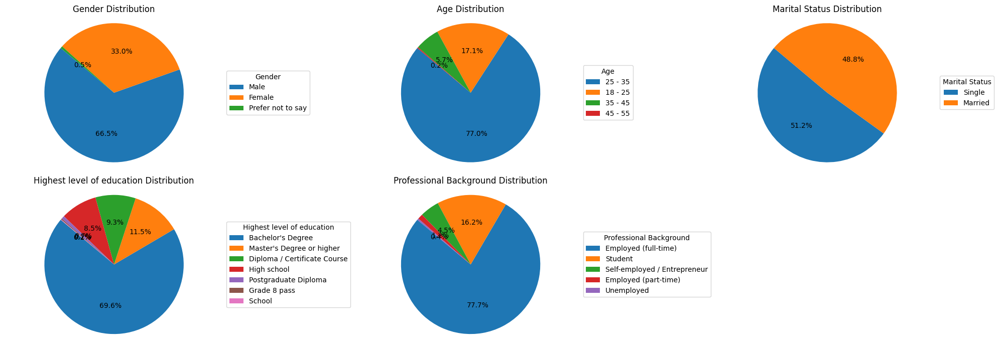

In [65]:
import matplotlib.pyplot as plt

# List of features to visualize
features = ['Gender', 'Age', 'Marital Status', "Highest level of education", "Professional Background"]

# Create 2x3 subplot grid
fig, axes = plt.subplots(2, 3, figsize=(20, 7))
axes = axes.flatten()

for i, feature in enumerate(features):
    value_counts = df[feature].dropna().value_counts()
    labels = value_counts.index
    sizes = value_counts.values

    wedges, texts, autotexts = axes[i].pie(
        sizes, labels=None, autopct='%1.1f%%', startangle=140
    )
    axes[i].set_title(f"{feature} Distribution")
    axes[i].axis('equal')  # Equal aspect ratio

    # Add legend outside the pie chart
    axes[i].legend(wedges, labels, title=feature, loc="center left", bbox_to_anchor=(1, 0.5))

# Hide the 6th subplot (if unused)
if len(features) < 6:
    axes[-1].axis('off')

plt.tight_layout()
plt.show()


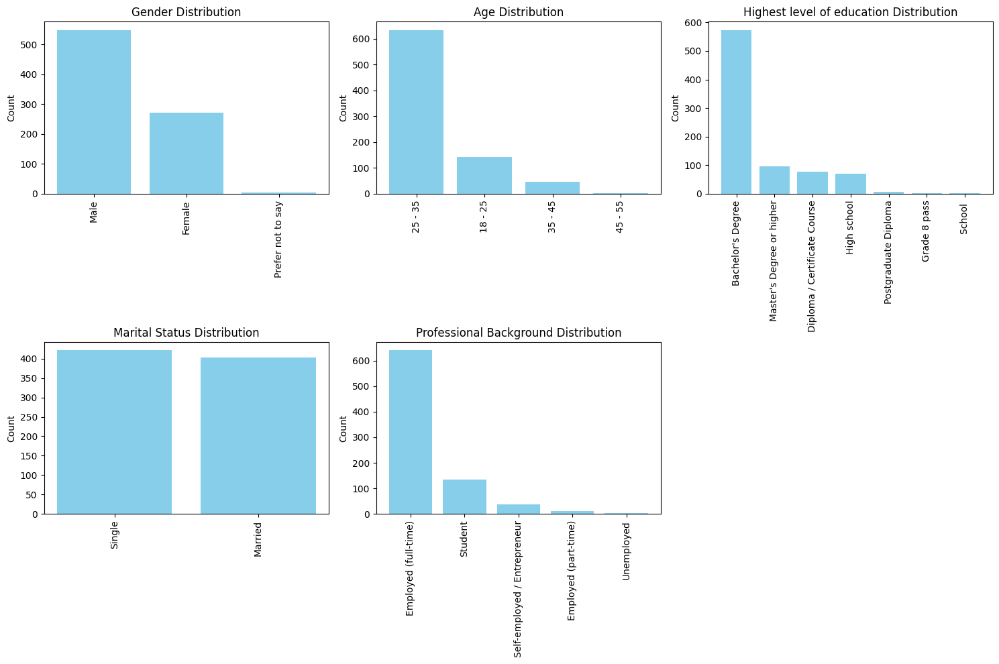

In [66]:
import matplotlib.pyplot as plt

# List of features to visualize
features = ['Gender', 'Age', 'Highest level of education', 'Marital Status', 'Professional Background']

# Create 2x3 subplot grid
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i, feature in enumerate(features):
    value_counts = df[feature].dropna().value_counts()
    
    axes[i].bar(value_counts.index.astype(str), value_counts.values, color='skyblue')
    axes[i].set_title(f"{feature} Distribution")
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=90)

# Hide the 6th subplot if unused
if len(features) < 6:
    axes[-1].axis('off')

plt.tight_layout()
plt.show()


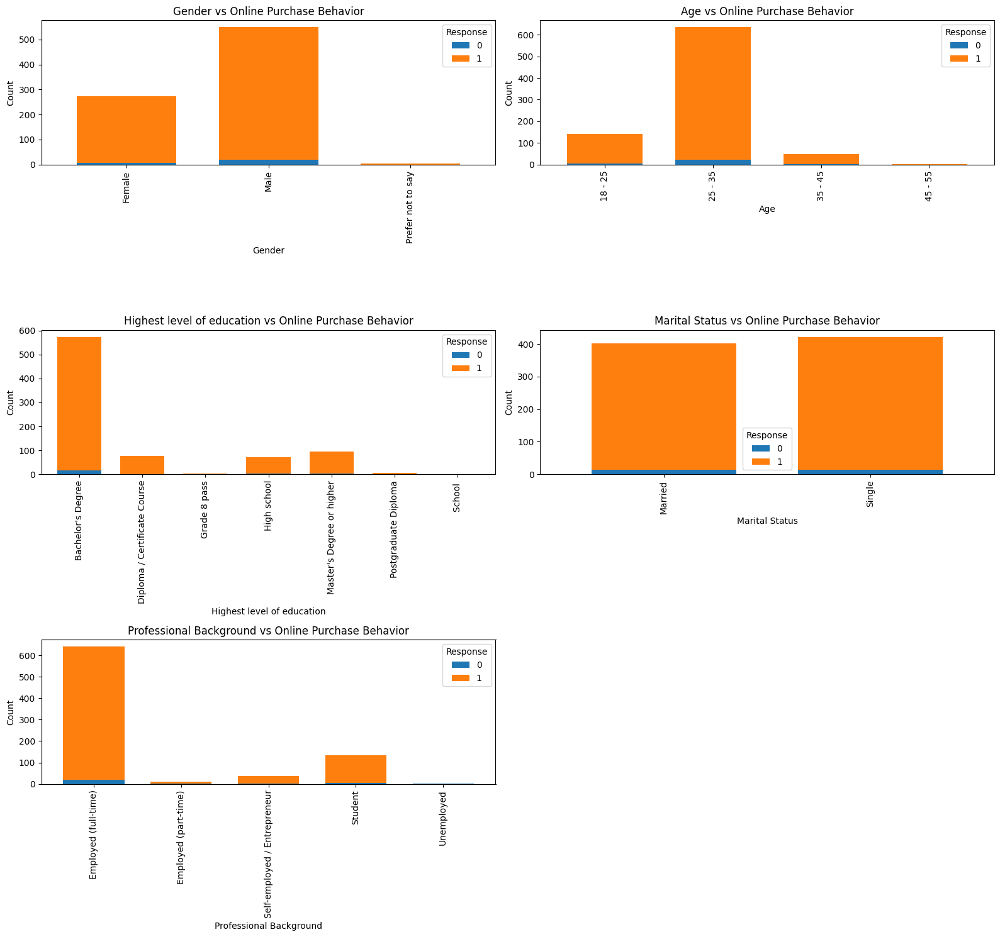

In [67]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Features to plot (excluding 'Gender' since we'll group by it)
features = ['Gender', 'Age', 'Highest level of education', 'Marital Status', 'Professional Background']

# Setup subplot layout
fig, axes = plt.subplots(3, 2, figsize=(16, 15))
axes = axes.flatten()

# Iterate and plot
for i, feature in enumerate(features):
    # Get cross-tabulation of feature vs online purchasing behavior
    grouped_data = pd.crosstab(df[feature], df['Have you made online purchases during crisis time?'])
    
    # Plot stacked bar chart
    grouped_data.plot(kind='bar', stacked=True, ax=axes[i], width=0.7)
    axes[i].set_title(f"{feature} vs Online Purchase Behavior")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].legend(title="Response")
    axes[i].tick_params(axis='x', rotation=90)

# Hide the last subplot if unused (optional, only if number of plots < subplot slots)
if len(features) < len(axes):
    for j in range(len(features), len(axes)):
        axes[j].axis('off')

plt.tight_layout()
plt.show()


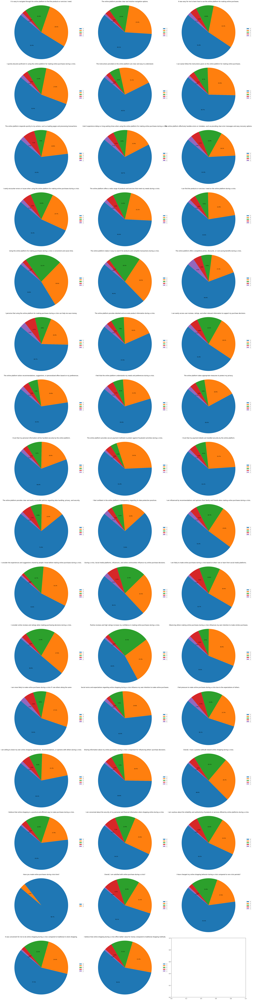

In [68]:
import matplotlib.pyplot as plt

# List of features to visualize
features = questions[11:58]

# Create 2x3 subplot grid
fig, axes = plt.subplots(16, 3, figsize=(30, 120))
axes = axes.flatten()

for i, feature in enumerate(features):
    value_counts = df[feature].dropna().value_counts()
    labels = value_counts.index
    sizes = value_counts.values

    wedges, texts, autotexts = axes[i].pie(
        sizes, labels=None, autopct='%1.1f%%', startangle=140
    )
    axes[i].set_title(f"{feature}")
    axes[i].axis('equal')  # Equal aspect ratio

    # Add legend outside the pie chart
    axes[i].legend(wedges, labels, loc="center left", bbox_to_anchor=(1, 0.5))

# Hide the 6th subplot (if unused)
if len(features) < 6:
    axes[-1].axis('off')

plt.tight_layout()
plt.show()

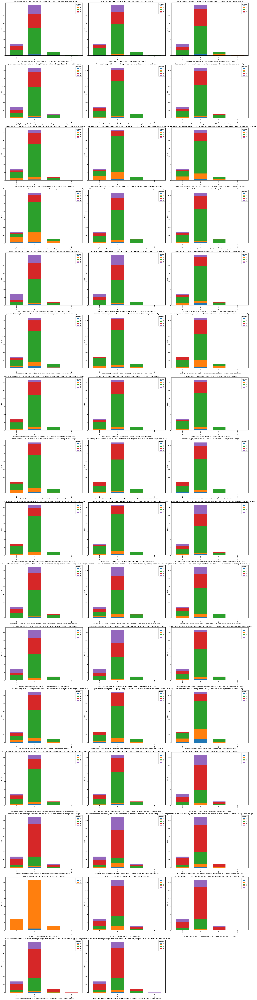

In [69]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Features to plot (excluding 'Gender' since we'll group by it)
features = questions[11:58]

# Setup subplot layout
fig, axes = plt.subplots(16, 3, figsize=(30, 120))
axes = axes.flatten()


# Iterate and plot
for i, feature in enumerate(features):
    # Get cross-tabulation of feature vs online purchasing behavior
    grouped_data = pd.crosstab(df["Age"], df[feature])
    
    # Plot stacked bar chart
    grouped_data.plot(kind='bar', stacked=True, ax=axes[i], width=0.7)
    axes[i].set_title(f"{feature} vs Age")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].legend(title="Response")
    axes[i].tick_params(axis='x', rotation=90)

# Hide the last subplot if unused (optional, only if number of plots < subplot slots)
if len(features) < len(axes):
    for j in range(len(features), len(axes)):
        axes[j].axis('off')

plt.tight_layout()
plt.show()


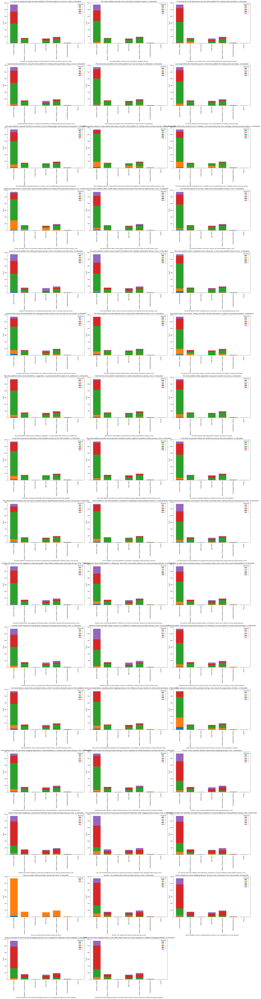

In [70]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Features to plot (excluding 'Gender' since we'll group by it)
features = questions[11:58]

# Setup subplot layout
fig, axes = plt.subplots(16, 3, figsize=(30, 120))
axes = axes.flatten()


# Iterate and plot
for i, feature in enumerate(features):
    # Get cross-tabulation of feature vs online purchasing behavior
    grouped_data = pd.crosstab(df['Highest level of education'],df[feature])
    
    # Plot stacked bar chart
    grouped_data.plot(kind='bar', stacked=True, ax=axes[i], width=0.7)
    axes[i].set_title(f"{feature} vs Education")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].legend(title="Response")
    axes[i].tick_params(axis='x', rotation=90)

# Hide the last subplot if unused (optional, only if number of plots < subplot slots)
if len(features) < len(axes):
    for j in range(len(features), len(axes)):
        axes[j].axis('off')

plt.tight_layout()
plt.show()


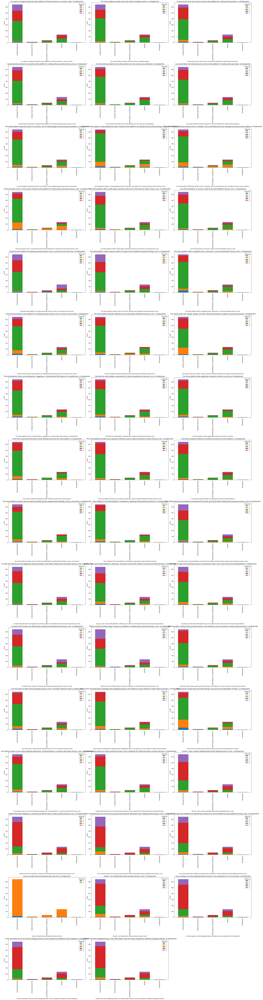

In [71]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Features to plot (excluding 'Gender' since we'll group by it)
features = questions[11:58]

# Setup subplot layout
fig, axes = plt.subplots(16, 3, figsize=(30, 120))
axes = axes.flatten()


# Iterate and plot
for i, feature in enumerate(features):
    # Get cross-tabulation of feature vs online purchasing behavior
    grouped_data = pd.crosstab(df['Professional Background'], df[feature])
    
    # Plot stacked bar chart
    grouped_data.plot(kind='bar', stacked=True, ax=axes[i], width=0.7)
    axes[i].set_title(f"{feature} vs Employment")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Count")
    axes[i].legend(title="Response")
    axes[i].tick_params(axis='x', rotation=90)

# Hide the last subplot if unused (optional, only if number of plots < subplot slots)
if len(features) < len(axes):
    for j in range(len(features), len(axes)):
        axes[j].axis('off')

plt.tight_layout()
plt.show()


# **Exploratory Data Analysis**

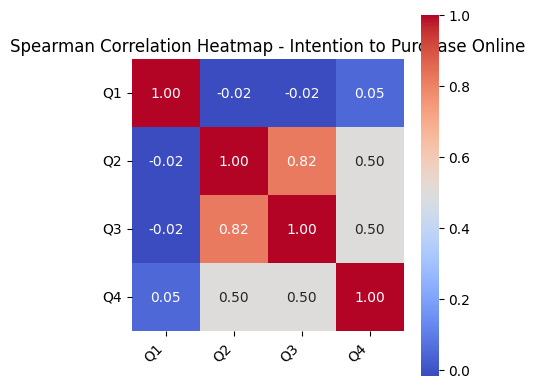

Legend for Intention to Purchase Online:
  Q1: Overall, I am satisfied with online purchase during a crisis?
  Q2: I Have changed my online shopping behavior during a crisis compared to non-crisis periods?
  Q3: It was convenient for me to do online shopping during a crisis compared to traditional in-store shopping.
  Q4: I believe that online shopping during a crisis offers better value for money compared to traditional shopping methods.

--------------------------------------------------------------------------------



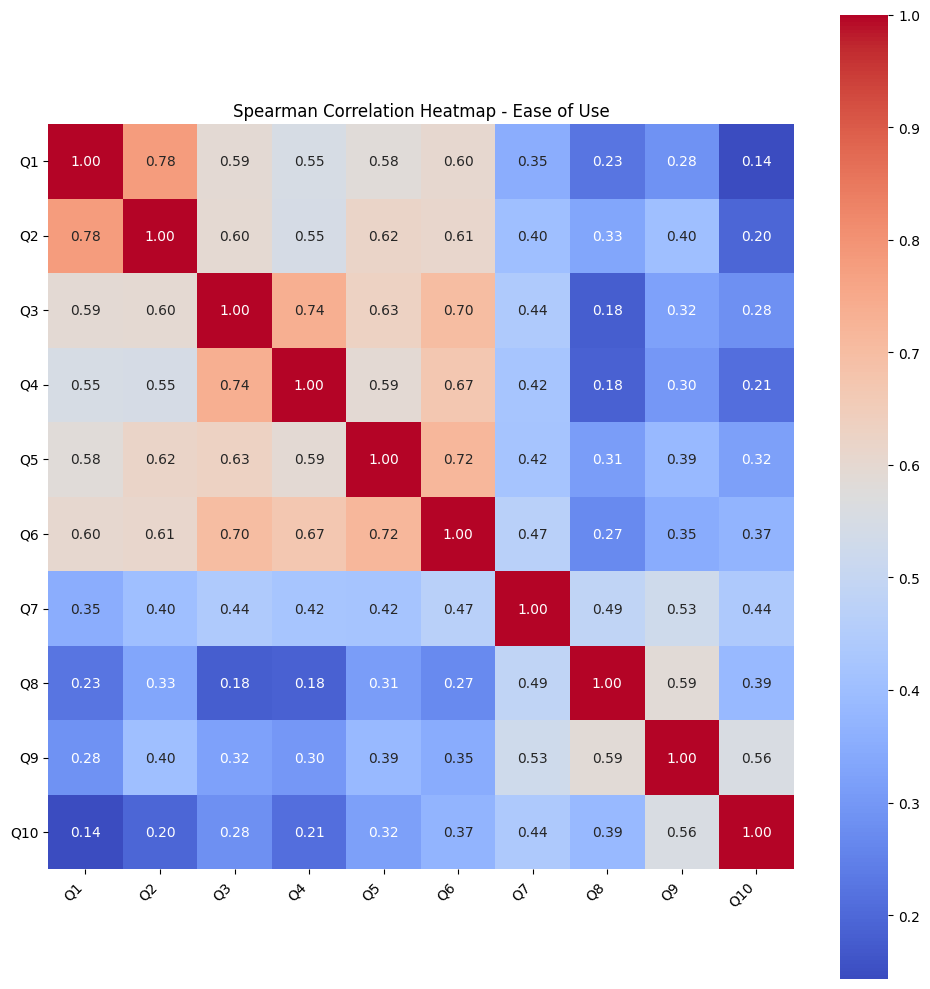

Legend for Ease of Use:
  Q1: It is easy to navigate through the online platform to find the products or services I need.
  Q2: The online platform provides clear and intuitive navigation options.
  Q3: It was easy for me to learn how to use the online platform for making online purchases.
  Q4: I quickly became proficient in using the online platform for making online purchases during a crisis.
  Q5: The instructions provided on the online platform are clear and easy to understand.
  Q6: I can easily follow the instructions given on the online platform for making online purchases.
  Q7: The online platform responds quickly to my actions, such as loading pages and processing transactions.
  Q8: I don't experience delays or long waiting times when using the online platform for making online purchases during a crisis.
  Q9: The online platform effectively handles errors or mistakes, such as providing clear error messages and easy recovery options.
  Q10: I rarely encounter errors or issu

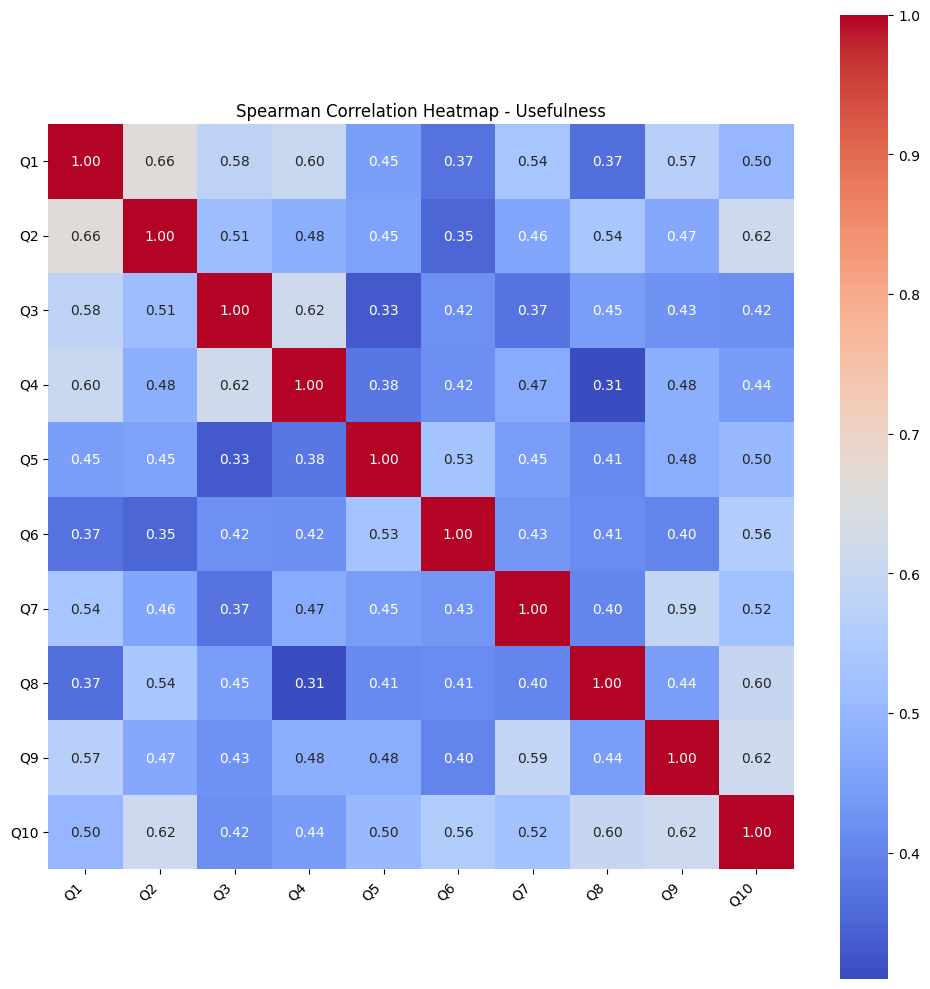

Legend for Usefulness:
  Q1: The online platform offers a wide range of products and services that meet my needs during a crisis.
  Q2: I can find the products or services I need on the online platform during a crisis.
  Q3: Using the online platform for making purchases during a crisis is convenient and saves time.
  Q4: The online platform makes it easy to search for products and complete transactions during a crisis.
  Q5: The online platform offers competitive prices, discounts, or cost-saving benefits during a crisis.
  Q6: I perceive that using the online platform for making purchases during a crisis can help me save money.
  Q7: The online platform provides detailed and accurate product information during a crisis.
  Q8: I can easily access user reviews, ratings, and other relevant information to support my purchase decisions.
  Q9: The online platform tailors recommendations, suggestions, or personalized offers based on my preferences.
  Q10: I feel that the online platform und

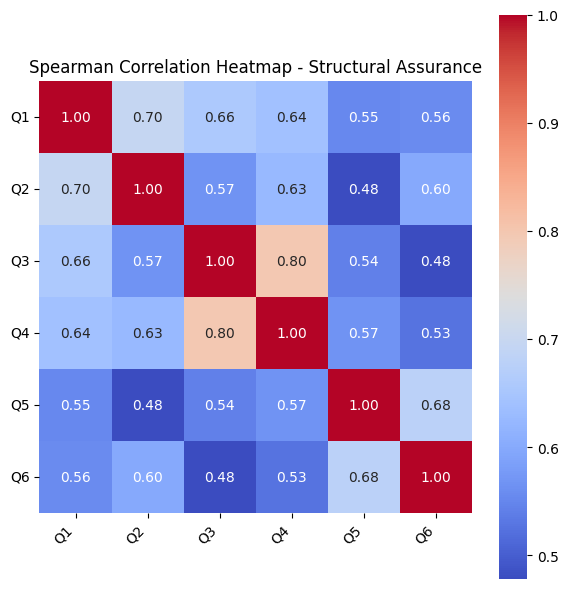

Legend for Structural Assurance:
  Q1: The online platform takes appropriate measures to protect my privacy.
  Q2: I trust that my personal information will be handled securely by the online platform.
  Q3: The online platform provides secure payment methods to protect against fraudulent activities during a crisis.
  Q4: I trust that my payment details are handled securely by the online platform.
  Q5: The online platform provides clear and easily accessible policies regarding data handling, privacy, and security.
  Q6: I feel confident in the online platform's transparency regarding its data protection practices.

--------------------------------------------------------------------------------



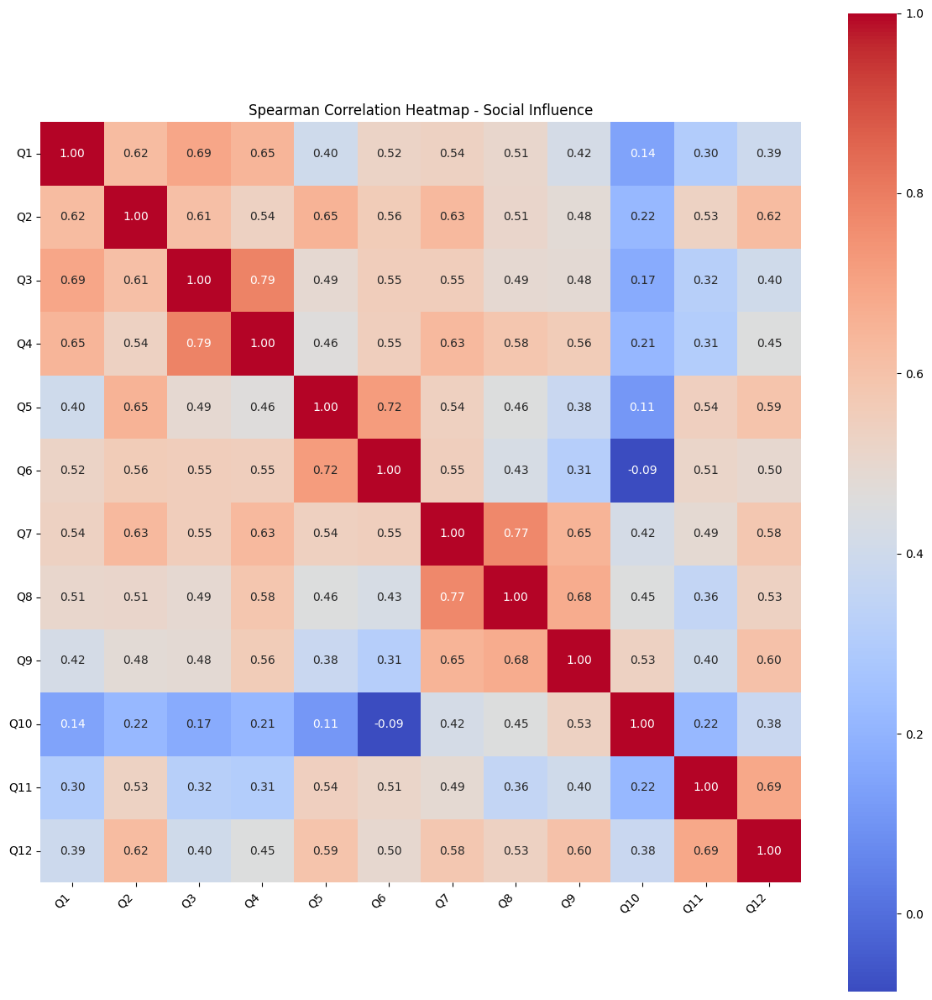

Legend for Social Influence:
  Q1: I am influenced by recommendations and opinions from family and friends when making online purchases during a crisis.
  Q2: I consider the experiences and suggestions shared by people I know before making online purchases during a crisis.
  Q3: During a crisis, Social media platforms, influencers, and online communities influence my online purchase decisions.
  Q4: I am likely to make online purchases during a crisis based on what I see or learn from social media platforms.
  Q5: I consider online reviews and ratings when making purchasing decisions during a crisis.
  Q6: Positive reviews and high ratings increase my confidence in making online purchases during a crisis.
  Q7: Observing others making online purchases during a crisis influences my own intention to make similar purchases.
  Q8: I am more likely to make online purchases during a crisis if I see others doing the same
  Q9: Social norms and expectations regarding online shopping during a c

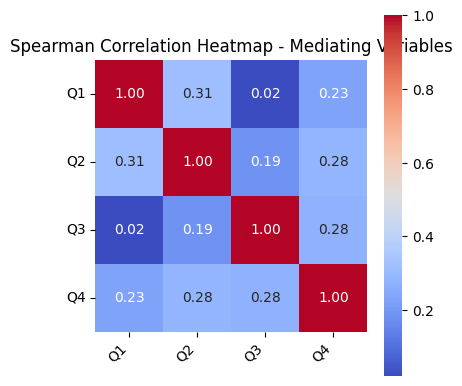

Legend for Mediating Variables:
  Q1: Overall, I have a positive attitude toward online shopping during a crisis.
  Q2: I believe that online shopping is a practical and efficient way to make purchases during a crisis.
  Q3: I am concerned about the security of my personal and financial information when shopping online during a crisis.
  Q4: I am cautious about the reliability and authenticity of products or services offered by online platforms during a crisis.

--------------------------------------------------------------------------------



In [72]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def plot_pairwise_correlation_heatmaps(df, factor_items):
    for factor, item_columns in factor_items.items():
        data = df[item_columns].dropna()

        if data.shape[1] < 2:
            print(f"Skipping {factor}: Not enough items to compute correlation.")
            continue

        corr_matrix = data.corr(method='spearman')

        # Create short labels: Q1, Q2, ...
        short_labels = [f"Q{i+1}" for i in range(len(item_columns))]
        label_map = dict(zip(short_labels, item_columns))

        # Re-map columns in the correlation matrix to short labels
        corr_matrix.columns = short_labels
        corr_matrix.index = short_labels

        # Plot heatmap
        plt.figure(figsize=(len(item_columns), len(item_columns)))
        sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar=True)
        plt.title(f"Spearman Correlation Heatmap - {factor}")
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()

        # Print the legend/key
        print(f"Legend for {factor}:")
        for label, full_name in label_map.items():
            print(f"  {label}: {full_name}")
        print("\n" + "-"*80 + "\n")


factor_items = {
    # 'Ease of Navigation': questions[11:13],
    # 'Learn Curve': questions[13:15],
    # 'Clarity of Instructions': questions[15:17],
    # 'Response Time': questions[17:19],
    # 'Error Handling': questions[19:21],
    # 'Product Availability': questions[21:23],
    # 'Convenience': questions[23:25],
    # 'Cost-effectiveness': questions[25:27],
    # 'Information Accessibility': questions[27:29],
    # 'Personalization': questions[29:31],
    # 'Privacy Protection': questions[31:33],
    # 'Payment Security': questions[33:35],
    # 'Transparent Policies': questions[35:37],
    # 'Word of Mouth and Recommendations': questions[37:39],
    # 'Social Media Influence': questions[39:41],
    # 'Online Reviews and Ratings': questions[41:43],
    # 'Social Proof': questions[43:45],
    # 'Normative Pressure': questions[45:47],
    # 'Information Sharing': questions[47:49],
    # 'Attitude': questions[49:51],
    # 'Perceived Risk': questions[51:53],
    'Intention to Purchase Online': questions[54:58],
    'Ease of Use': questions[11:21],
    'Usefulness': questions[21:31],
    'Structural Assurance': questions[31:37],  
    'Social Influence': questions[37:49],
    'Mediating Variables' : questions[49:53]
}

# Call the function
plot_pairwise_correlation_heatmaps(df, factor_items)


In [73]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# def plot_full_heatmap(df, item_columns):
#     # Drop rows with missing values in selected columns
#     data = df[item_columns].dropna()

#     # Check if there's enough data
#     if data.shape[1] < 2:
#         print("Not enough items to compute correlation.")
#         return

#     # Compute Spearman correlation
#     corr_matrix = data.corr(method='spearman')

#     # Create short labels: Q1, Q2, ...
#     short_labels = [f"Q{i+1}" for i in range(len(item_columns))]
#     label_map = dict(zip(short_labels, item_columns))

#     # Re-map correlation matrix
#     corr_matrix.columns = short_labels
#     corr_matrix.index = short_labels

#     # Plot heatmap
#     plt.figure(figsize=(len(item_columns) * 0.6, len(item_columns) * 0.6))
#     sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", square=True, cbar=True)
#     plt.title("Spearman Correlation Heatmap - All Questions")
#     plt.xticks(rotation=45, ha='right')
#     plt.yticks(rotation=0)
#     plt.tight_layout()
#     plt.show()

#     # Print the legend/key for short labels
#     print("Legend for Questions:")
#     for label, full_name in label_map.items():
#         print(f"  {label}: {full_name}")

# # Call the function
# plot_full_heatmap(df, questions[11:58])


In [74]:
df_h = pd.DataFrame(df[df.columns[:11]])

In [75]:

# Add each composite column by averaging its respective question responses
df_h['Ease of Navigation'] = df[questions[11:13]].mean(axis=1)
df_h['Learn Curve'] = df[questions[13:15]].mean(axis=1)
df_h['Clarity of Instructions'] = df[questions[15:17]].mean(axis=1)
df_h['Response Time'] = df[questions[17:19]].mean(axis=1)
df_h['Error Handling'] = df[questions[19:21]].mean(axis=1)
df_h['Product Availability'] = df[questions[21:23]].mean(axis=1)
df_h['Convenience'] = df[questions[23:25]].mean(axis=1)
df_h['Cost-effectiveness'] = df[questions[25:27]].mean(axis=1)
df_h['Information Accessibility'] = df[questions[27:29]].mean(axis=1)
df_h['Personalization'] = df[questions[29:31]].mean(axis=1)
df_h['Privacy Protection'] = df[questions[31:33]].mean(axis=1)
df_h['Payment Security'] = df[questions[33:35]].mean(axis=1)
df_h['Transparent Policies'] = df[questions[35:37]].mean(axis=1)
df_h['Word of Mouth and Recommendations'] = df[questions[37:39]].mean(axis=1)
df_h['Social Media Influence'] = df[questions[39:41]].mean(axis=1)
df_h['Online Reviews and Ratings'] = df[questions[41:43]].mean(axis=1)
df_h['Social Proof'] = df[questions[43:45]].mean(axis=1)
df_h['Normative Pressure'] = df[questions[45:47]].mean(axis=1)
df_h['Information Sharing'] = df[questions[47:49]].mean(axis=1)
df_h['Attitude'] = df[questions[49:51]].mean(axis=1)
df_h['Perceived Risk'] = df[questions[51:53]].mean(axis=1)

# Higher-level constructs (reuse earlier subconstructs)
df_h['Intention to Purchase Online'] = df[questions[54:58]].mean(axis=1)
df_h['Perceived Ease of Use'] = df[questions[11:21]].mean(axis=1)
df_h['Percieved Usefulness'] = df[questions[21:31]].mean(axis=1)
df_h['Structural Assurance'] = df[questions[31:37]].mean(axis=1)
df_h['Social Influence'] = df[questions[37:49]].mean(axis=1)


In [76]:
df["Mean Intesion to Purchase Online"] = df[questions[54:58]].mean(axis=1)

/tmp/ipykernel_13/951803529.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["Mean Intesion to Purchase Online"] = df[questions[54:58]].mean(axis=1)


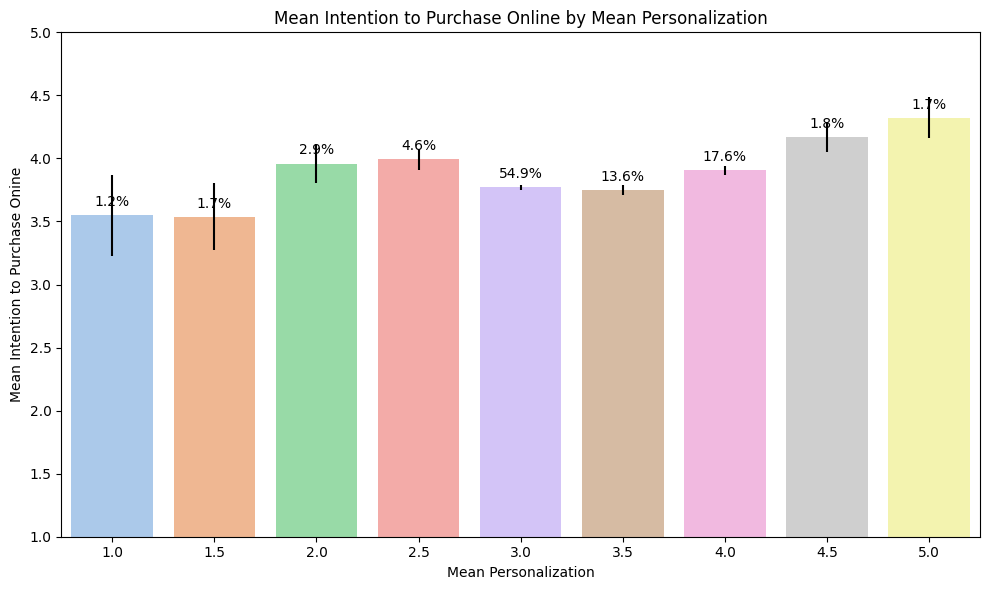

In [77]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Example DataFrame structure
# Replace this with your actual DataFrame
# df = pd.read_csv('your_file.csv')

# Assuming:
# - 'Response_Time_1' is on the x-axis
# - 'Intension_to_Purchase' is on the y-axis

# Calculate mean and error for each category
grouped = df_h.groupby('Personalization')['Intention to Purchase Online']
summary = grouped.agg(['mean', 'count', 'std']).reset_index()
summary['sem'] = summary['std'] / summary['count']**0.5
summary['percent'] = summary['count'] / summary['count'].sum() * 100

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(data=summary, x='Personalization', y='mean', yerr=summary['sem'], palette='pastel')

# Annotate each bar with percentage
for idx, row in summary.iterrows():
    plt.text(idx, row['mean'] + 0.05, f"{row['percent']:.1f}%", ha='center', va='bottom', fontsize=10)

# Labels and styling
plt.title('Mean Intention to Purchase Online by Mean Personalization')
plt.xlabel('Mean Personalization')
plt.ylabel('Mean Intention to Purchase Onine')
plt.ylim(1, 5)
plt.tight_layout()
plt.show()


In [78]:
# Define label encoding mapping
encoding_map = { 
    'Postgraduate Diploma': 7 ,
    "Master's Degree or higher" : 6 ,
    "Bachelor's Degree" : 5,
    'Diploma / Certificate Course': 4, 
    'High school': 3 ,
    'Grade 8 pass' : 2,
    'School' : 1
}

mappings = {
    '18 - 25' : 1,
    '25 - 35' : 2,
    '35 - 45' : 3,
    '45 - 55' : 4
}

df_h["Age"] = df_h["Age"].map(mappings)

df_h["Highest level of education"] = df_h["Highest level of education"].map(encoding_map)       


In [79]:
df_h

,Gender,Age,Highest level of education,Marital Status,Have used online shopping platforms before,Professional Background,General E-Commerce Platforms,Specialty Online Stores / automobile,Online pharmacies,Fashion and beauty retailers,Grocery delivery services,Ease of Navigation,Learn Curve,Clarity of Instructions,Response Time,Error Handling,Product Availability,Convenience,Cost-effectiveness,Information Accessibility,Personalization,Privacy Protection,Payment Security,Transparent Policies,Word of Mouth and Recommendations,Social Media Influence,Online Reviews and Ratings,Social Proof,Normative Pressure,Information Sharing,Attitude,Perceived Risk,Intention to Purchase Online,Perceived Ease of Use,Percieved Usefulness,Structural Assurance,Social Influence
0,Male,2,5.0,Single,1,Employed (full-time),"daraz, ikman",Haven't used,Haven't used,Haven't used,ubereats,4.0,4.0,4.0,3.5,3.5,4.0,3.0,3.5,4.0,3.5,1.0,1.5,1.5,3.0,3.5,4.0,3.5,3.0,2.0,3.0,3.0,2.75,3.8,3.6,1.333333,3.166667
1,Male,2,5.0,Single,1,Employed (full-time),"daraz, ikman",patpat,"epharma, onlinepharmacy","fashionbug, kapruka, odel","keellssuper, pickmefoods, ubereats",3.5,4.0,3.0,3.0,3.0,4.0,3.0,3.0,3.0,3.0,3.0,4.0,4.0,3.5,3.0,3.5,3.5,3.0,3.5,3.5,3.5,4.00,3.3,3.2,3.666667,3.333333
2,Female,2,5.0,Single,1,Employed (full-time),"daraz, ikman, kapruka","patpat, riyasewana","healthgurd, onlinepharmacy","fashionbug, noorareed, odel, thilakawardana","pickmefoods, ubereats",3.5,3.5,4.0,3.5,4.0,2.5,4.5,3.0,4.5,4.0,3.0,5.0,4.0,4.0,3.5,5.0,3.5,2.0,4.0,4.5,4.0,4.50,3.7,3.7,4.000000,3.666667
3,Female,2,6.0,Married,1,Employed (full-time),"daraz, ikman",lankavechicle,onlinepharmacy,fashionbug,"pickmefoods, ubereats",3.5,2.5,2.5,2.0,2.5,3.5,4.0,3.5,2.5,3.5,4.5,4.0,3.5,3.0,4.5,4.5,4.0,4.5,4.0,3.5,3.5,4.00,2.6,3.4,4.000000,4.083333
4,Male,2,5.0,Married,1,Employed (full-time),"daraz, wow",riyasewana,"ceymed, epharma","fashionbug, midnightdivas","keellssuper, pickmefoods, ubereats",3.5,4.0,3.5,3.5,4.0,4.5,4.5,4.5,4.0,4.0,4.0,3.0,4.0,4.0,4.0,4.0,4.0,3.0,3.5,4.0,3.5,3.75,3.7,4.3,3.666667,3.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
831,Male,2,6.0,Single,1,Employed (full-time),"daraz, ikman, kapruka, takas","autolanka, pricelanka",Haven't used,"gflock, kapruka",arpico,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.0,3.0,4.00,3.0,3.0,3.000000,3.000000
832,Male,2,6.0,Single,1,Employed (full-time),"daraz, ikman, kapruka, takas","autolanka, pricelanka",Haven't used,kapruka,arpico,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.5,4.00,3.0,3.0,3.000000,3.000000
833,Male,2,6.0,Single,1,Employed (full-time),"daraz, ikman, kapruka, takas","autolanka, pricelanka",Haven't used,kapruka,arpico,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.5,3.50,3.0,3.0,3.000000,3.000000
834,Male,2,6.0,Single,1,Employed (full-time),"daraz, ikman, kapruka, takas","autolanka, pricelanka",Haven't used,kapruka,arpico,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,3.0,4.5,3.25,3.0,3.0,3.000000,3.000000


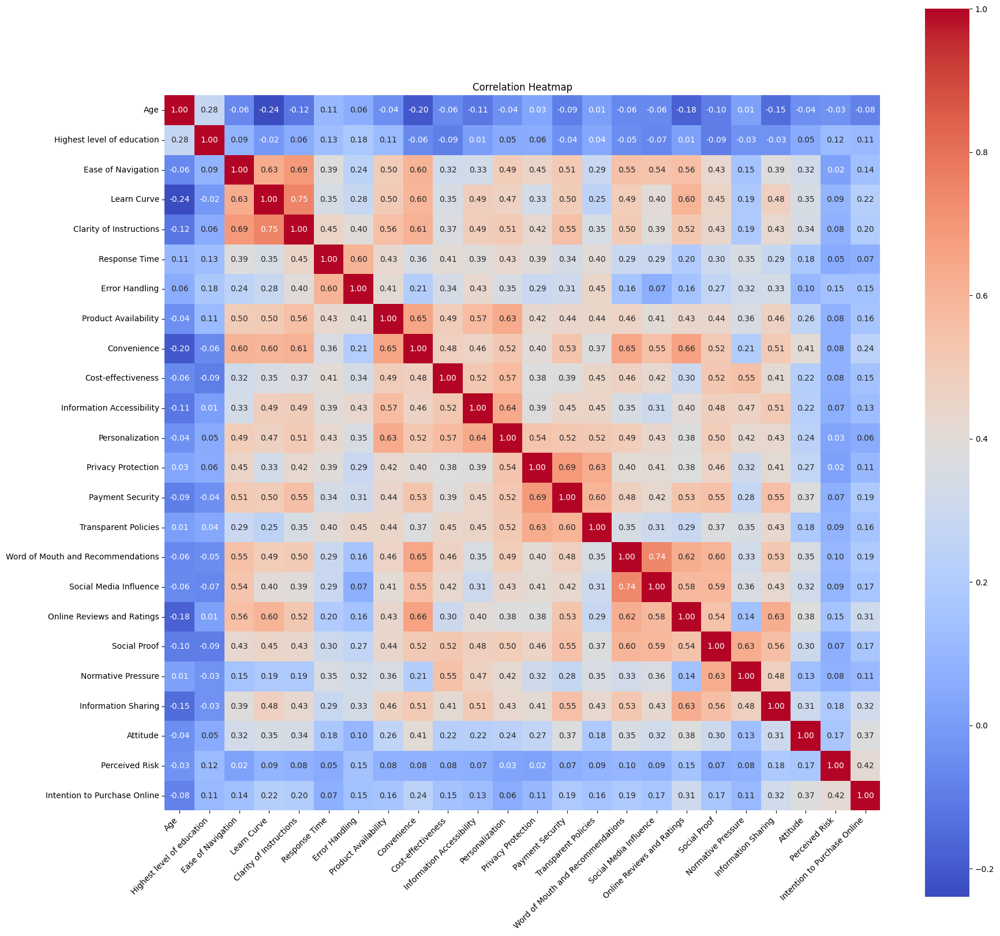

In [80]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def correlation_heatmap(df, factor_items):
    data = df[factor_items].dropna()

    if data.shape[1] < 2:
        print(f"Skipping {factor}: Not enough items to compute correlation.")
        return

    corr_matrix = data.corr(method='spearman')

    # Plot heatmap
    plt.figure(figsize=(20, 20))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True, square=True)
    plt.title(f"Correlation Heatmap")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()


# Call the function
factor_items = list(df_h.columns[1:3]) + list(df_h.columns[11:33]) 
correlation_heatmap(df_h, factor_items)

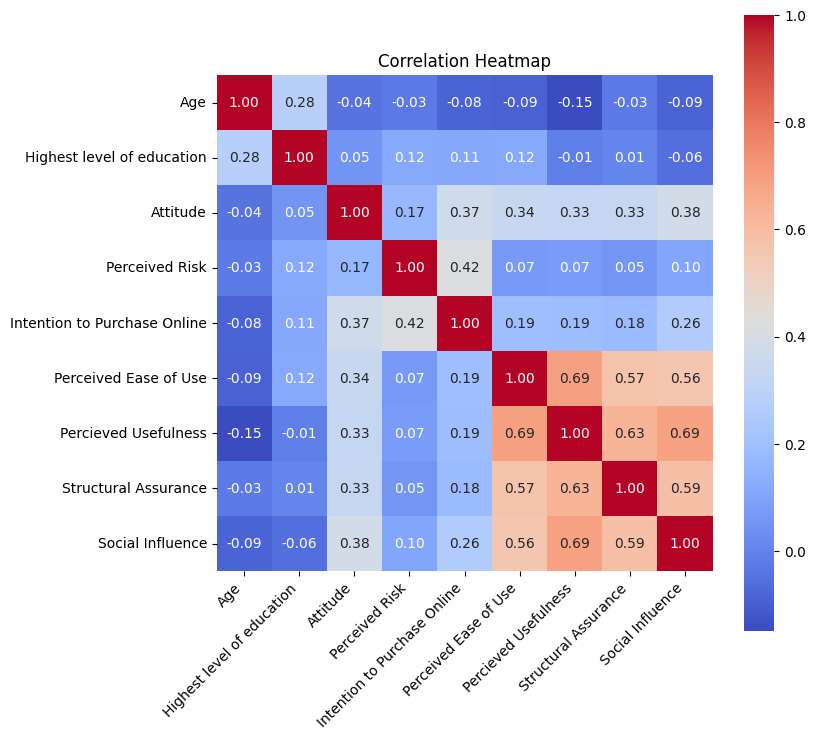

In [81]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def correlation_heatmap(df, factor_items):
    data = df[factor_items].dropna()

    if data.shape[1] < 2:
        print(f"Skipping {factor}: Not enough items to compute correlation.")
        return

    corr_matrix = data.corr(method='spearman')

    # Plot heatmap
    plt.figure(figsize=(8, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True, square=True)
    plt.title(f"Correlation Heatmap")
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()


# Call the function
factor_items = list(df_h.columns[1:3]) + list(df_h.columns[30:38])
correlation_heatmap(df_h, factor_items)

In [82]:
import pandas as pd
from scipy.stats import chi2_contingency

# Suppose you already have these columns in your DataFrame:
# 'Ease of Navigation' and 'Intention to Purchase Online' (categorical or ordinal values)

# Step 1: Create the contingency table
contingency_table = pd.crosstab(df_h['Ease of Navigation'], df_h['Intention to Purchase Online'])

print("Contingency Table:")
print(contingency_table)

Contingency Table:
Intention to Purchase Online  1.50  1.75  2.00  2.25  2.50  2.75  3.00  3.25  \
Ease of Navigation                                                             
1.0                              0     1     2     0     0     0     0     0   
1.5                              1     1     0     1     1     0     0     0   
2.0                              0     1     0     0     0     1     0     2   
2.5                              0     0     0     0     0     0     3     0   
3.0                              0     1     1     2     2    11    21    36   
3.5                              0     0     0     0     0     3     6    11   
4.0                              0     0     0     0     1     2     5     9   
4.5                              0     0     0     1     0     0     1     1   
5.0                              0     0     0     0     0     2     1     8   

Intention to Purchase Online  3.50  3.75  4.00  4.25  4.50  4.75  5.00  
Ease of Navigation         

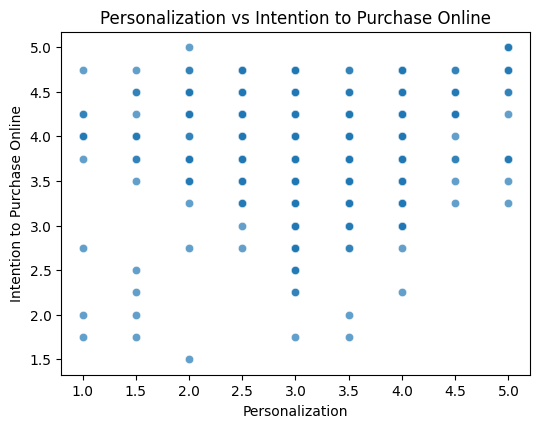

In [83]:
import matplotlib.pyplot as plt
import seaborn as sns

# List of independent composite variables
independent_vars = [
    'Personalization'
]

# Dependent variable
dependent_var = 'Intention to Purchase Online'

# Plotting
plt.figure(figsize=(20, 20))
for i, var in enumerate(independent_vars):
    plt.subplot(5, 4, i + 1)
    sns.scatterplot(data=df_h, x=var, y=dependent_var, alpha=0.7)
    plt.title(f"{var} vs {dependent_var}")
    plt.xlabel(var)
    plt.ylabel(dependent_var)

plt.tight_layout()
plt.show()


# **Hypothesis Testing**

**hypothesis 1**

In [84]:
from scipy.stats import spearmanr
corr, p_value = spearmanr(df_h['Perceived Ease of Use'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.19360578301736173, P-value: 2.0754481478398974e-08


**hypothesis 2**

In [85]:
corr, p_value = spearmanr(df_h['Percieved Usefulness'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.19027769499254027, P-value: 3.6413919408969154e-08


**hypothesis 3**

In [86]:
corr, p_value = spearmanr(df_h['Structural Assurance'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.18097510121525173, P-value: 1.6632496435783662e-07


**hypothesis 4**

In [87]:
corr, p_value = spearmanr(df_h['Social Influence'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.257216811279178, P-value: 6.218716323440867e-14


**hypothesis 5**

In [88]:
import statsmodels.api as sm
# Step 1
X1 = sm.add_constant(df_h['Perceived Ease of Use'])
model1 = sm.OLS(df_h['Intention to Purchase Online'], X1).fit()
print(model1.summary())
# Step 2
X2 = sm.add_constant(df_h['Perceived Ease of Use'])
model2 = sm.OLS(df_h['Attitude'], X2).fit()
print(model2.summary())
# Step 3
X3 = sm.add_constant(df_h[['Perceived Ease of Use', 'Attitude']])
model3 = sm.OLS(df_h['Intention to Purchase Online'], X3).fit()
print(model3.summary())

                                 OLS Regression Results                                 
Dep. Variable:     Intention to Purchase Online   R-squared:                       0.075
Model:                                      OLS   Adj. R-squared:                  0.074
Method:                           Least Squares   F-statistic:                     66.41
Date:                          Thu, 15 May 2025   Prob (F-statistic):           1.36e-15
Time:                                  20:59:05   Log-Likelihood:                -597.56
No. Observations:                           825   AIC:                             1199.
Df Residuals:                               823   BIC:                             1209.
Df Model:                                     1                                         
Covariance Type:                      nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------

**hypothesis 6**

In [89]:
import statsmodels.api as sm
# Step 1
X1 = sm.add_constant(df_h['Percieved Usefulness'])
model1 = sm.OLS(df_h['Intention to Purchase Online'], X1).fit()
print(model1.summary())
# Step 2
X2 = sm.add_constant(df_h['Percieved Usefulness'])
model2 = sm.OLS(df_h['Perceived Risk'], X2).fit()
print(model2.summary())
# Step 3
X3 = sm.add_constant(df_h[['Percieved Usefulness', 'Perceived Risk']])
model3 = sm.OLS(df_h['Intention to Purchase Online'], X3).fit()
print(model3.summary())

                                 OLS Regression Results                                 
Dep. Variable:     Intention to Purchase Online   R-squared:                       0.068
Model:                                      OLS   Adj. R-squared:                  0.067
Method:                           Least Squares   F-statistic:                     60.35
Date:                          Thu, 15 May 2025   Prob (F-statistic):           2.36e-14
Time:                                  20:59:05   Log-Likelihood:                -600.38
No. Observations:                           825   AIC:                             1205.
Df Residuals:                               823   BIC:                             1214.
Df Model:                                     1                                         
Covariance Type:                      nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
---------------------

**hypothesis 7**

In [90]:
corr, p_value = spearmanr(df_h['Ease of Navigation'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.14202818873951203, P-value: 4.2393032685419935e-05


**hypothesis 8**

In [91]:
corr, p_value = spearmanr(df_h['Clarity of Instructions'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.20584246611822185, P-value: 2.4102278405661193e-09


**hypothesis 9**

In [92]:
corr, p_value = spearmanr(df_h['Response Time'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.07607996063588794, P-value: 0.028882628417328946


**hypothesis 10**

In [93]:
corr, p_value = spearmanr(df_h['Error Handling'], df_h['Intention to Purchase Online'])
print(f"Correlation: {corr}, P-value: {p_value}")

Correlation: 0.14893676915712514, P-value: 1.7439795709379758e-05


**Age moderates the relationship between percieved ease of use and intention to purchase.**

In [94]:
# df_h['PEoU_x_Age'] = df_h['Ease of Use'] * df_h['Age']
# X = sm.add_constant(df_h[['Ease of Use', 'Age', 'PEoU_x_Age']])
# model = sm.OLS(df_h['Intention to Purchase Online'], X).fit()
# print(model.summary())  # Check significance of PU_x_Gender